# **Importing Dependencies**

In [ ]:
!pip install -q transformers accelerate peft diffusers torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.5/841.5 kB 36.1 MB/s eta 0:00:00


In [ ]:
from diffusers import StableDiffusionPipeline
from diffusers.utils import make_image_grid
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
from diffusers import AutoPipelineForText2Image
import torch
import os
import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchmetrics.functional.multimodal import clip_score
from functools import partial

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
def generate_image(pipeline, prompt, img_size=256):
  img = pipeline(prompt, num_inference_steps=50).images[0]
  print(f"Prompt : {prompt}")
  return make_image_grid([img], rows=1, cols=1, resize=img_size)

In [ ]:
prompts = [
    "white puffer jacket with a red box logo on the front",
    "dark blue jean with an animal printing",
    "Sweatshirt with Hoodie",
    "black sweatshirt with a colorful print on the front",
    "white hoodie with a black cat print on the front",
    "Khaki short"
]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Pre-trained Distilled Stable Diffusion Model**

In [ ]:
general_model_path = "/content/drive/MyDrive/Datasets/sdp_1_model_distilled"
general_model_pipleline = StableDiffusionPipeline.from_pretrained(general_model_path).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


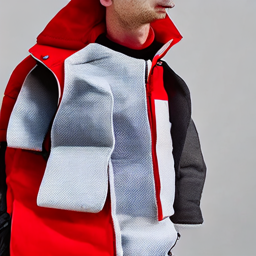

In [ ]:
generate_image(general_model_pipleline, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


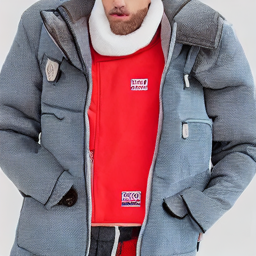

In [ ]:
generate_image(general_model_pipleline, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


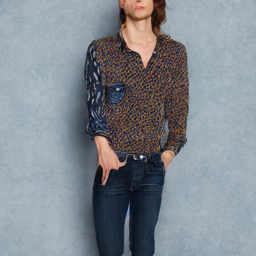

In [ ]:
generate_image(general_model_pipleline, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


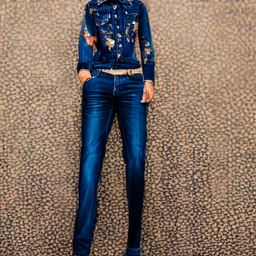

In [ ]:
generate_image(general_model_pipleline, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


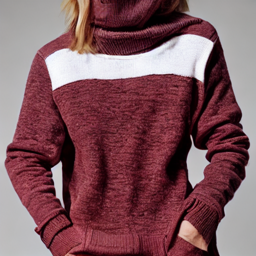

In [ ]:
generate_image(general_model_pipleline, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


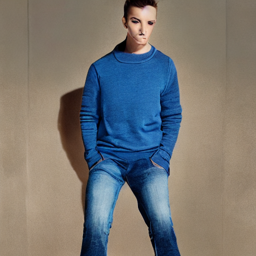

In [ ]:
generate_image(general_model_pipleline, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


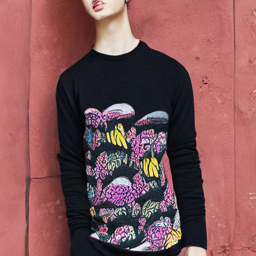

In [ ]:
generate_image(general_model_pipleline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


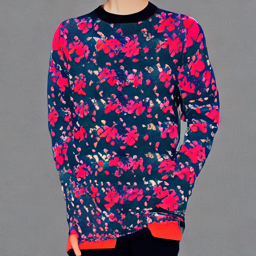

In [ ]:
generate_image(general_model_pipleline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


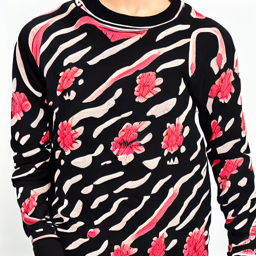

In [ ]:
generate_image(general_model_pipleline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


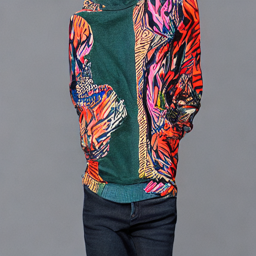

In [ ]:
generate_image(general_model_pipleline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


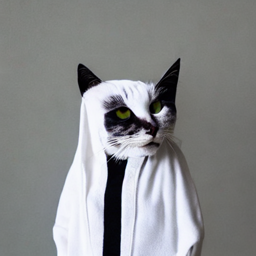

In [ ]:
generate_image(general_model_pipleline, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


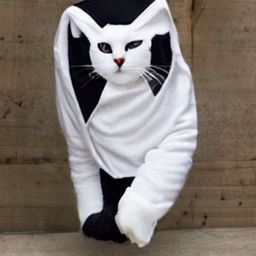

In [ ]:
generate_image(general_model_pipleline, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


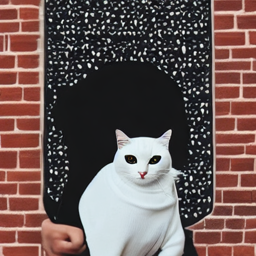

In [ ]:
generate_image(general_model_pipleline, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


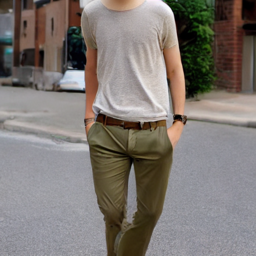

In [ ]:
generate_image(general_model_pipleline, prompts[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


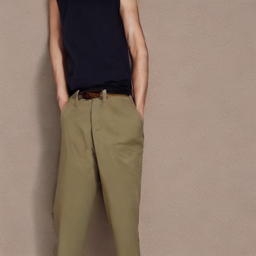

In [ ]:
generate_image(general_model_pipleline, prompts[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


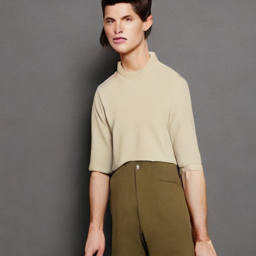

In [ ]:
generate_image(general_model_pipleline, prompts[5])

# **Fine-Tuned Distilled Stable Diffusion Model**

In [ ]:
model_path = "/content/drive/MyDrive/Datasets/fine_tuned_model"
model_fine_tuned_pipeline = StableDiffusionPipeline.from_pretrained(model_path).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


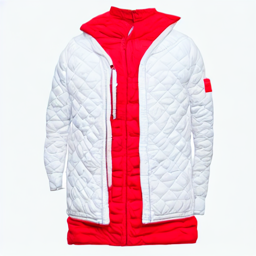

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


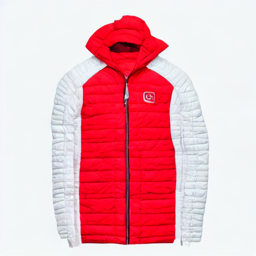

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


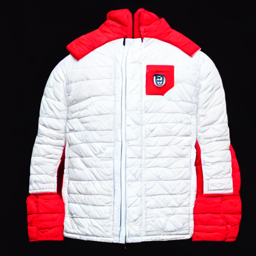

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


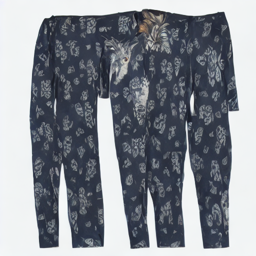

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


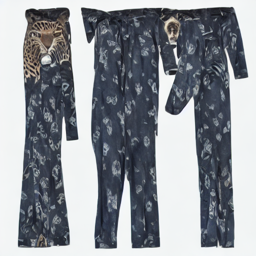

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


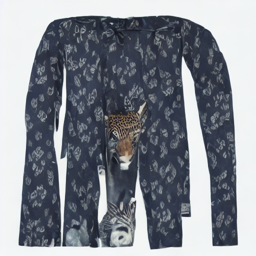

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


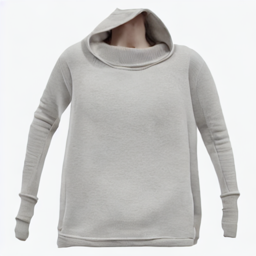

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


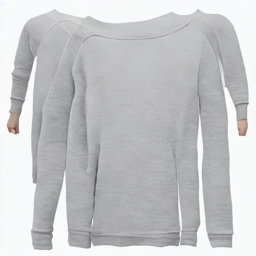

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


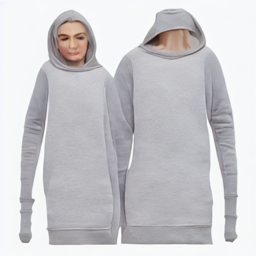

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


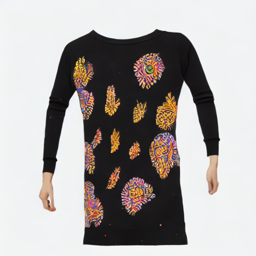

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


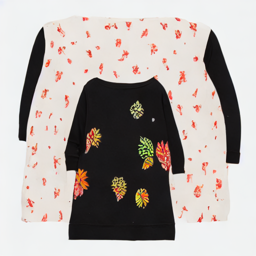

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


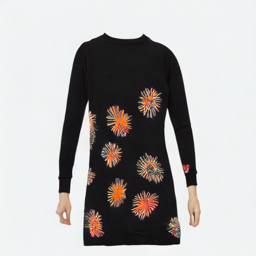

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


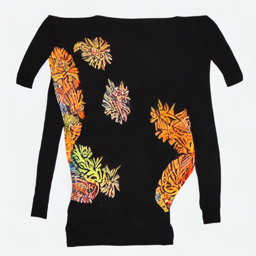

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


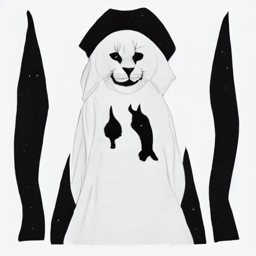

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


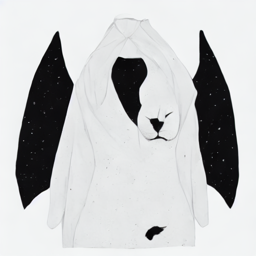

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


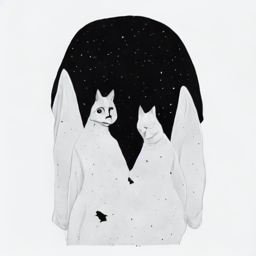

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


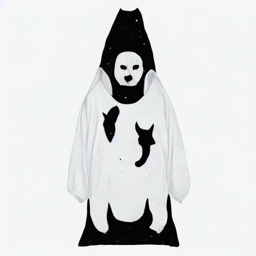

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


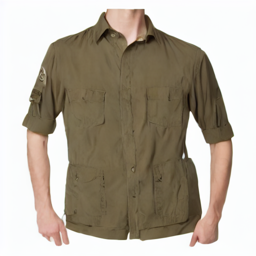

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


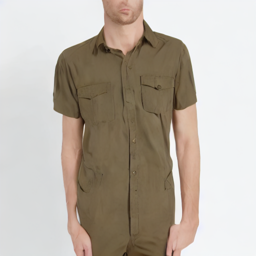

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


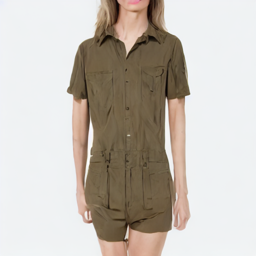

In [ ]:
generate_image(model_fine_tuned_pipeline, prompts[5])

# **Fine-Tuned With Hyperparameter Distilled Stable Diffusion Model**

In [ ]:
model_path_hyper = "/content/drive/MyDrive/Datasets/fine_tuned_200e_distilled_model"
model_fine_tuned_pipeline_hp = StableDiffusionPipeline.from_pretrained(model_path_hyper).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


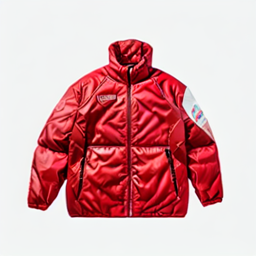

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


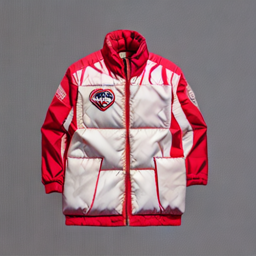

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


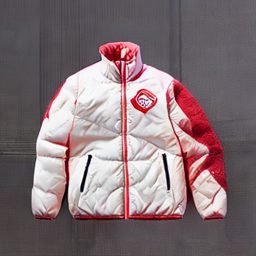

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


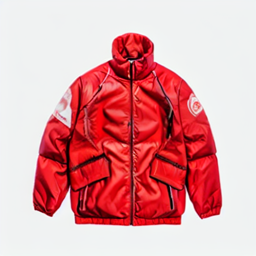

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


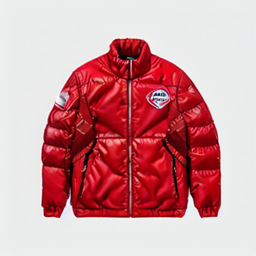

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


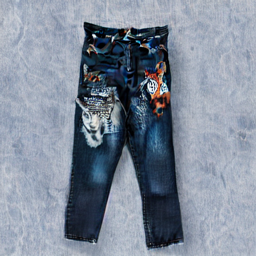

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


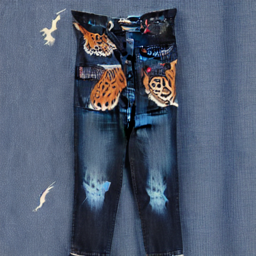

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark blue jean with an animal printing


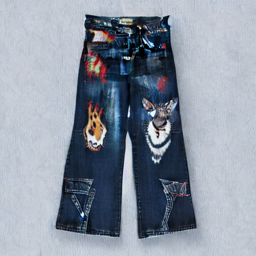

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


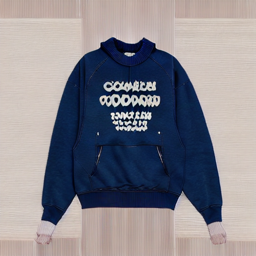

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


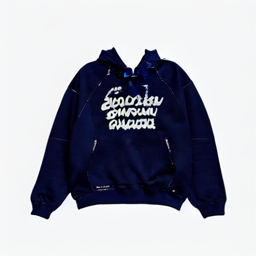

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Sweatshirt with Hoodie


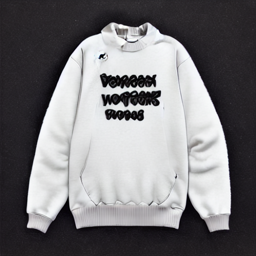

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


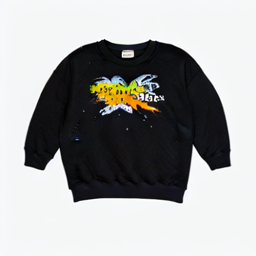

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


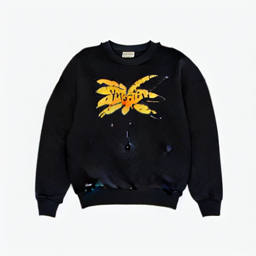

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


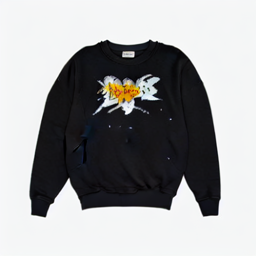

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


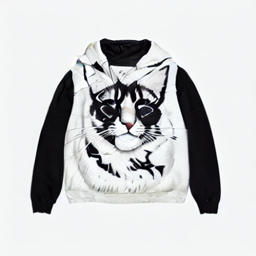

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


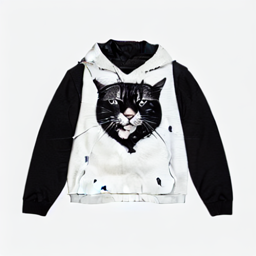

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white hoodie with a black cat print on the front


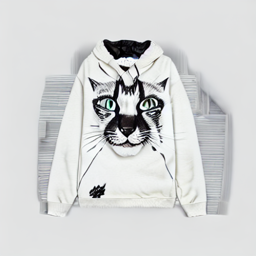

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


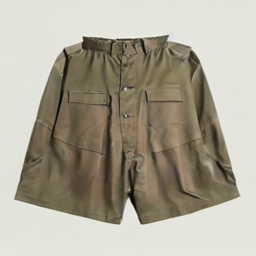

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


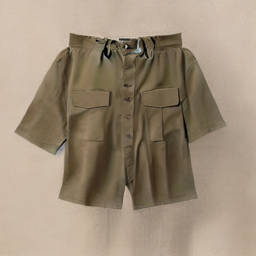

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Khaki short


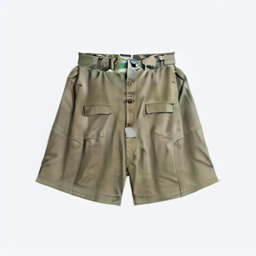

In [ ]:
generate_image(model_fine_tuned_pipeline_hp, prompts[5])

# **FIne-Tuned ControlNet Stable Diffusion Model**

In [ ]:
controlnet_path = "/content/drive/MyDrive/Datasets/fine_tuned_model_controlnet"
base_model_path = "/content/drive/MyDrive/Datasets/controlnet_base_model"

In [ ]:
controlnet = ControlNetModel.from_pretrained(controlnet_path, torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    base_model_path, controlnet=controlnet, torch_dtype=torch.float16
)

# speed up diffusion process with faster scheduler and memory optimization
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

# memory optimization.
pipe.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
def generate_image_with_controlnet(pipeline, prompt, control_img,img_size=256):
  img = pipeline(prompt, num_inference_steps=50, image=control_img).images[0]
  print(f"Prompt : {prompt}")
  return make_image_grid([img], rows=1, cols=1, resize=img_size)

In [ ]:
def get_canny_image(img_path, low_threshold=100, high_threshold=200):
  ori_image = Image.open(img_path)
  image = np.array(ori_image)
  image = cv2.Canny(image, low_threshold, high_threshold)
  image = image[:, :, None]
  image = np.concatenate([image, image, image], axis=2)
  canny_image = Image.fromarray(image)
  return ori_image, canny_image

control_images = []
dir_path = "/content/drive/MyDrive/Datasets/imgs/images"
for img_path in os.listdir(dir_path):
  full_img_path = os.path.join(dir_path, img_path)
  _, canny_img = get_canny_image(full_img_path)
  control_images.append(canny_img)

In [ ]:
len(control_images)

6

In [ ]:
prompts = [
    "white puffer jacket with a red box logo on the front",
    "dark blue jean with an animal printing",
    "Sweatshirt with Hoodie",
    "black sweatshirt with a colorful print on the front",
    "white hoodie with a black cat print on the front",
    "Khaki short"
]

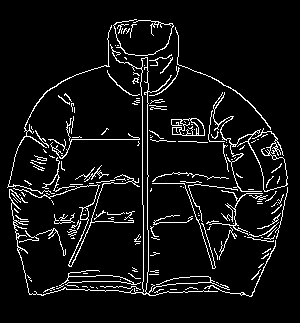

In [ ]:
control_images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : white puffer jacket with a red box logo on the front


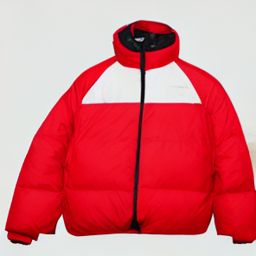

In [ ]:
prompt = "white puffer jacket with a red box logo on the front"
generate_image_with_controlnet(pipe, prompt, control_images[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black puffer jacket


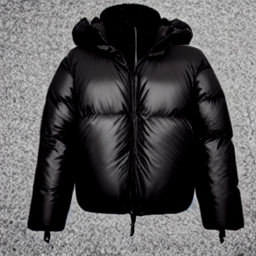

In [ ]:
prompt = "black puffer jacket"
generate_image_with_controlnet(pipe, prompt, control_images[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Blue puffer jacket with a white box logo on the front


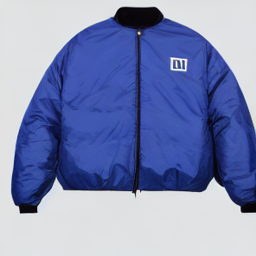

In [ ]:
prompt = "Blue puffer jacket with a white box logo on the front"
generate_image_with_controlnet(pipe, prompt, control_images[0])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : Green puffer jacket


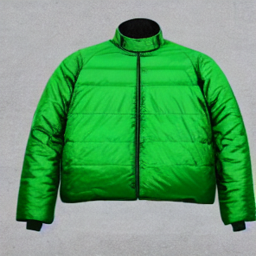

In [ ]:
prompt = "Green puffer jacket"
generate_image_with_controlnet(pipe, prompt, control_images[0])

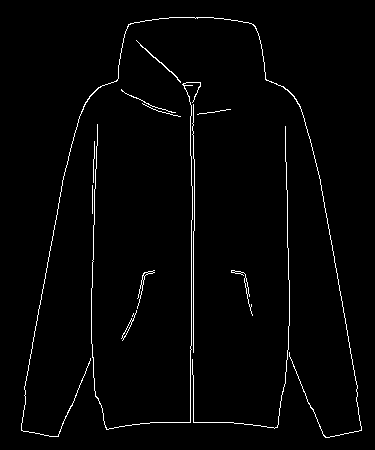

In [ ]:
control_images[1]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : colorful Sweatshirt with Hoodie


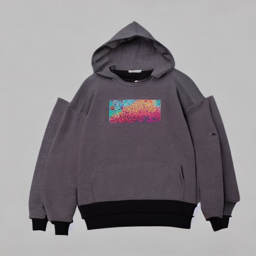

In [ ]:
prompt = "colorful Sweatshirt with Hoodie"
generate_image_with_controlnet(pipe, prompt, control_images[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : red Sweatshirt with Hoodie


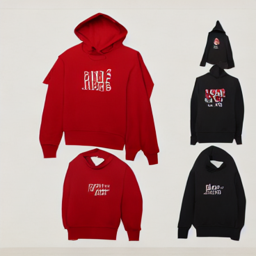

In [ ]:
prompt = "red Sweatshirt with Hoodie"
generate_image_with_controlnet(pipe, prompt, control_images[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : one violet Sweatshirt with Hoodie


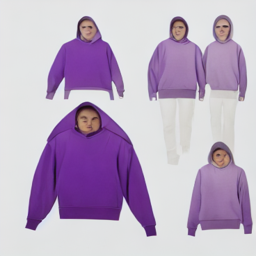

In [ ]:
prompt = "one violet Sweatshirt with Hoodie"
generate_image_with_controlnet(pipe, prompt, control_images[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : blue Hoodie


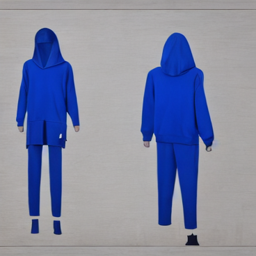

In [ ]:
prompt = "blue Hoodie"
generate_image_with_controlnet(pipe, prompt, control_images[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : blue Sweatshirt with Hoodie


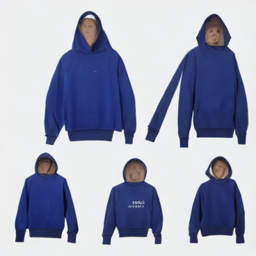

In [ ]:
prompt = "blue Sweatshirt with Hoodie"
generate_image_with_controlnet(pipe, prompt, control_images[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : green Sweatshirt with Hoodie


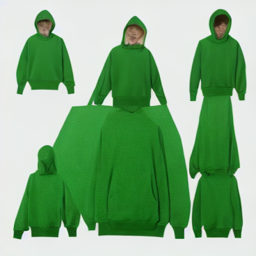

In [ ]:
prompt = "green Sweatshirt with Hoodie"
generate_image_with_controlnet(pipe, prompt, control_images[1])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : maroon Sweatshirt with Hoodie


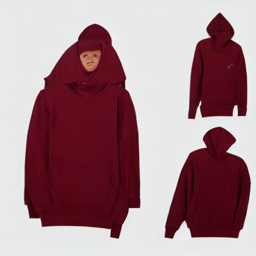

In [ ]:
prompt = "maroon Sweatshirt with Hoodie"
generate_image_with_controlnet(pipe, prompt, control_images[1])

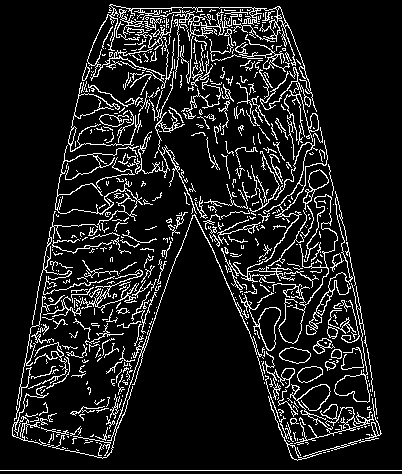

In [ ]:
control_images[2]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : colorful jean with an animal printing on it


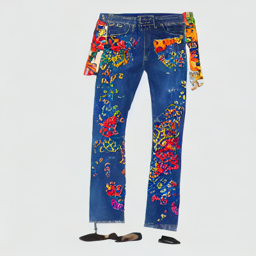

In [ ]:
prompt = "colorful jean with an animal printing on it"
generate_image_with_controlnet(pipe, prompt, control_images[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : dark green jean with an animal printing on it


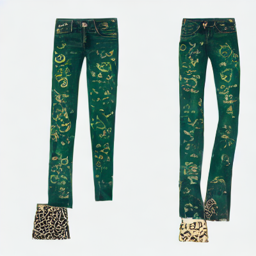

In [ ]:
prompt = "dark green jean with an animal printing on it"
generate_image_with_controlnet(pipe, prompt, control_images[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : gray jean with an animal printing on it


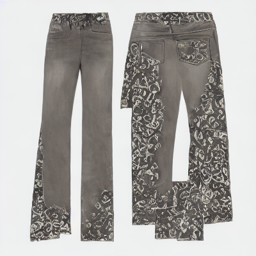

In [ ]:
prompt = "gray jean with an animal printing on it"
generate_image_with_controlnet(pipe, prompt, control_images[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : navy jean with an animal printing on it


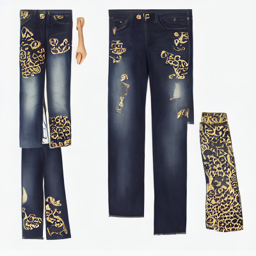

In [ ]:
prompt = "navy jean with an animal printing on it"
generate_image_with_controlnet(pipe, prompt, control_images[2])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : gold jean with an animal printing on it


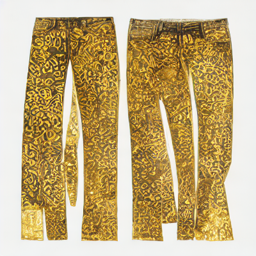

In [ ]:
prompt = "gold jean with an animal printing on it"
generate_image_with_controlnet(pipe, prompt, control_images[2])

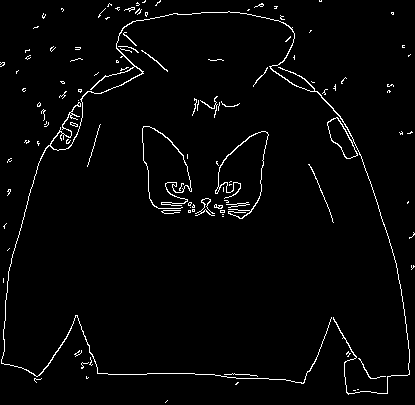

In [ ]:
control_images[3]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : brown hoodie with a black cat print on the front


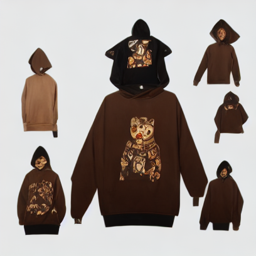

In [ ]:
prompt = "brown hoodie with a black cat print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : navy hoodie with a black cat print on the front


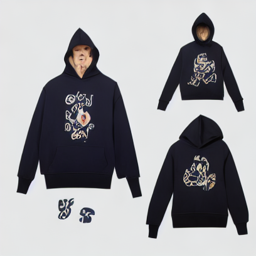

In [ ]:
prompt = "navy hoodie with a black cat print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : green hoodie with a white cat print on the front


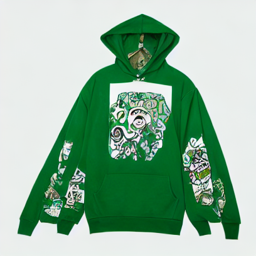

In [ ]:
prompt = "green hoodie with a white cat print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : purple hoodie with a white cat print on the front


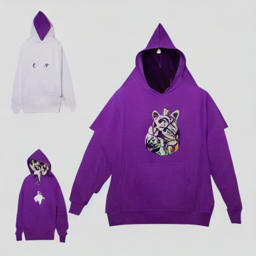

In [ ]:
prompt = "purple hoodie with a white cat print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[3])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : maroon hoodie with a black cat print on the front


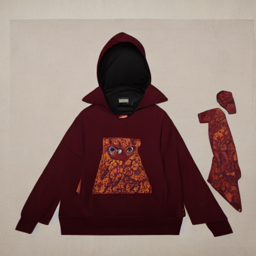

In [ ]:
prompt = "maroon hoodie with a black cat print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[3])

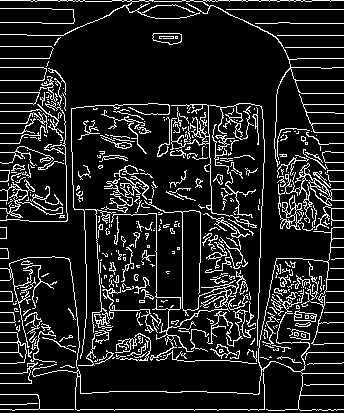

In [ ]:
control_images[4]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : black sweatshirt with a colorful print on the front


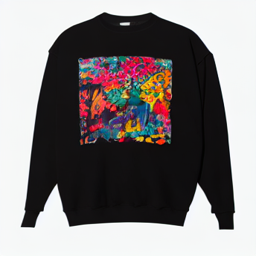

In [ ]:
prompt = "black sweatshirt with a colorful print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : maroon sweatshirt with a colorful print on the front


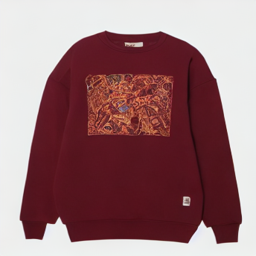

In [ ]:
prompt = "maroon sweatshirt with a colorful print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : green sweatshirt with a colorful print on the front


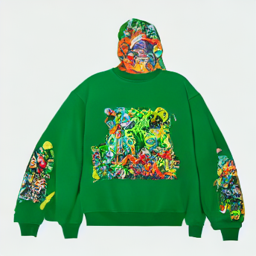

In [ ]:
prompt = "green sweatshirt with a colorful print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : gray sweatshirt with a colorful print on the front


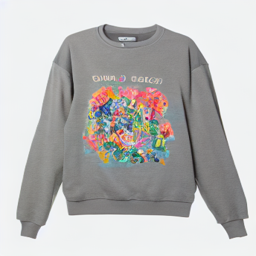

In [ ]:
prompt = "gray sweatshirt with a colorful print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[4])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : orange sweatshirt with a colorful print on the front


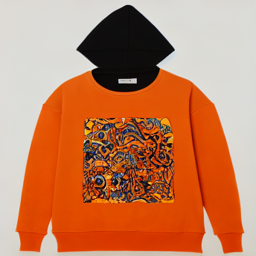

In [ ]:
prompt = "orange sweatshirt with a colorful print on the front"
generate_image_with_controlnet(pipe, prompt, control_images[4])

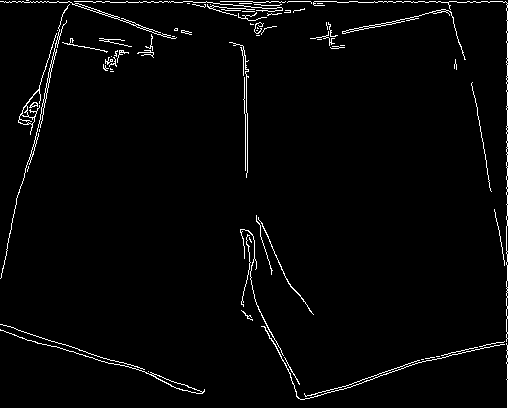

In [ ]:
control_images[5]

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : colorful short


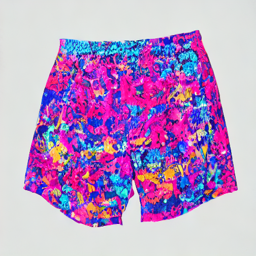

In [ ]:
prompt = "colorful short"
generate_image_with_controlnet(pipe, prompt, control_images[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : maroon short


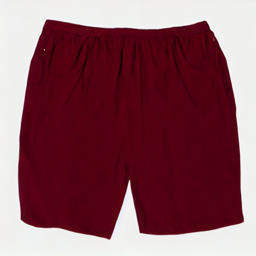

In [ ]:
prompt = "maroon short"
generate_image_with_controlnet(pipe, prompt, control_images[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : navy short


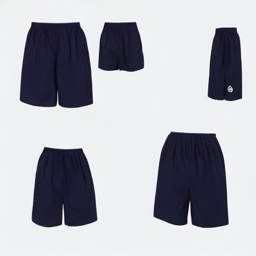

In [ ]:
prompt = "navy short"
generate_image_with_controlnet(pipe, prompt, control_images[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : purple short


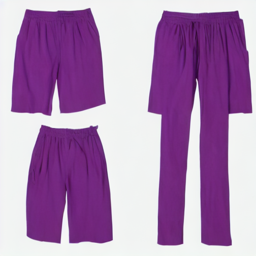

In [ ]:
prompt = "purple short"
generate_image_with_controlnet(pipe, prompt, control_images[5])

  0%|          | 0/50 [00:00<?, ?it/s]

Prompt : green short


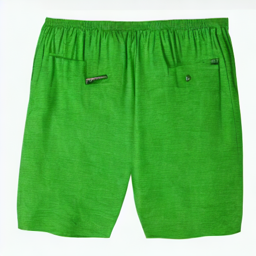

In [ ]:
prompt = "green short"
generate_image_with_controlnet(pipe, prompt, control_images[5])

# **LoRA Based FIne-Tuned Stable Diffusion Model**

In [ ]:
def generated_image_with_lora(pipeline, prompt, scale = 1, num_inference_steps = 50, resize = 256):
  "For Single Prompt"
  image_lora = pipeline(prompt, num_inference_steps=num_inference_steps, cross_attention_kwargs={"scale": scale}).images[0]
  print(f"Prompt : {prompt}")
  return make_image_grid([image_lora], rows=1, cols=1, resize = resize)

In [ ]:
base_large_param_model_path = "/content/drive/MyDrive/Datasets/base_sd_model"
lora_weight_path = "/content/drive/MyDrive/Datasets/lora_model_weights"
lora_pipeline = AutoPipelineForText2Image.from_pretrained(base_large_param_model_path, torch_dtype=torch.float16).to("cuda")
lora_pipeline.load_lora_weights(lora_weight_path, weight_name="pytorch_lora_weights.safetensors")

In [ ]:
generated_image_with_lora(lora_pipeline, prompts[0])

# **Evaluation of Model**

In [ ]:
prompts = [
    "white puffer jacket with a red box logo on the front",
    "dark blue jean with an animal printing",
    "Sweatshirt with Hoodie",
    "black sweatshirt with a colorful print on the front",
    "white hoodie with a black cat print on the front",
    "Khaki short"
]

In [ ]:
clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")

def calculate_clip_score(images, prompts):
    images_np = np.array(images)
    images_int = (images_np * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

In [ ]:
general_model_path = "/content/drive/MyDrive/Datasets/sdp_1_model_distilled"
general_model_pipleline = StableDiffusionPipeline.from_pretrained(general_model_path).to("cuda")
images_general = general_model_pipleline(prompts).images

sd_clip_score_general_model = calculate_clip_score(images_general, prompts)
print(f"CLIP Score with general: {sd_clip_score_general_model}")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIP Score with general: 27.1347


In [ ]:
model_path = "/content/drive/MyDrive/Datasets/fine_tuned_model"
model_fine_tuned_pipeline = StableDiffusionPipeline.from_pretrained(model_path).to("cuda")
images_fine_tuned = model_fine_tuned_pipeline(prompts).images

sd_clip_score_finetuned = calculate_clip_score(images_fine_tuned, prompts)
print(f"CLIP Score with finetuned: {sd_clip_score_finetuned}")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

CLIP Score with finetuned: 25.9056


In [ ]:
model_path_hyper = "/content/drive/MyDrive/Datasets/fine_tuned_200e_distilled_model"
model_fine_tuned_pipeline_hp = StableDiffusionPipeline.from_pretrained(model_path_hyper).to("cuda")

torch.cuda.empty_cache()
images_fine_tuned_200e = model_fine_tuned_pipeline_hp(prompts).images

sd_clip_score_finetuned_200e = calculate_clip_score(images_fine_tuned_200e, prompts)
print(f"CLIP Score with finetuned with 200 epoch: {sd_clip_score_finetuned_200e}")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


CLIP Score with finetuned with 200 epoch: 28.3536


In [ ]:
torch.cuda.empty_cache()
controlnet_path = "/content/drive/MyDrive/Datasets/fine_tuned_model_controlnet"
base_model_path = "/content/drive/MyDrive/Datasets/controlnet_base_model"

controlnet = ControlNetModel.from_pretrained(controlnet_path, torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    base_model_path, controlnet=controlnet, torch_dtype=torch.float16
)

# speed up diffusion process with faster scheduler and memory optimization
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

# memory optimization.
pipe.enable_model_cpu_offload()


def get_canny_image(img_path, low_threshold=100, high_threshold=200):
  ori_image = Image.open(img_path)
  image = np.array(ori_image)
  image = cv2.Canny(image, low_threshold, high_threshold)
  image = image[:, :, None]
  image = np.concatenate([image, image, image], axis=2)
  canny_image = Image.fromarray(image)
  return ori_image, canny_image

control_images = []
dir_path = "/content/drive/MyDrive/Datasets/imgs/images"
for img_path in os.listdir(dir_path):
  full_img_path = os.path.join(dir_path, img_path)
  _, canny_img = get_canny_image(full_img_path)
  control_images.append(canny_img)

images_controlnet = pipe(prompts, image=control_images).images

sd_clip_score_finetuned_controlnet = calculate_clip_score(images_controlnet, prompts)
print(f"CLIP Score with finetuned controlnet model: {sd_clip_score_finetuned_controlnet}")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIP Score with finetuned controlnet model: 27.8392


In [ ]:
torch.cuda.empty_cache()
base_large_param_model_path = "/content/drive/MyDrive/Datasets/base_sd_model"
lora_weight_path = "/content/drive/MyDrive/Datasets/lora_model_weights"
lora_pipeline = AutoPipelineForText2Image.from_pretrained(base_large_param_model_path, torch_dtype=torch.float16).to("cuda")
lora_pipeline.load_lora_weights(lora_weight_path, weight_name="pytorch_lora_weights.safetensors")
images_fine_tuned_with_lora = lora_pipeline(prompts).images

sd_clip_score_finetuned_with_lora = calculate_clip_score(images_fine_tuned_with_lora, prompts)
print(f"CLIP Score with finetuned with LoRA: {sd_clip_score_finetuned_with_lora}")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

CLIP Score with finetuned with LoRA: 29.1478
